In [1]:
#This project analyzes the most up-to-date statistic on COVID-19 in the world.
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
#Import the datasheet
df = pd.read_csv(r'C:\Users\Arian\Desktop\Programming\Python\PycharmProjects\Covid\covid_19_data.csv')

In [3]:
#Reference
df.head(10)

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0
5,6,01/22/2020,Guangdong,Mainland China,1/22/2020 17:00,26.0,0.0,0.0
6,7,01/22/2020,Guangxi,Mainland China,1/22/2020 17:00,2.0,0.0,0.0
7,8,01/22/2020,Guizhou,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
8,9,01/22/2020,Hainan,Mainland China,1/22/2020 17:00,4.0,0.0,0.0
9,10,01/22/2020,Hebei,Mainland China,1/22/2020 17:00,1.0,0.0,0.0


In [ ]:
#Drop the unnecessary columns
df.drop(columns=['SNo','Last Update'], inplace=True)
df.head(10)

In [225]:
#Rename some of the column headings for simplicity
df.rename(columns={'ObservationDate':'Date','Country/Region':'Country'}, inplace=True)
df.head(10)

,Date,Province/State,Country,Confirmed,Deaths,Recovered
0,01/22/2020,Anhui,Mainland China,1.0,0.0,0.0
1,01/22/2020,Beijing,Mainland China,14.0,0.0,0.0
2,01/22/2020,Chongqing,Mainland China,6.0,0.0,0.0
3,01/22/2020,Fujian,Mainland China,1.0,0.0,0.0
4,01/22/2020,Gansu,Mainland China,0.0,0.0,0.0
5,01/22/2020,Guangdong,Mainland China,26.0,0.0,0.0
6,01/22/2020,Guangxi,Mainland China,2.0,0.0,0.0
7,01/22/2020,Guizhou,Mainland China,1.0,0.0,0.0
8,01/22/2020,Hainan,Mainland China,4.0,0.0,0.0
9,01/22/2020,Hebei,Mainland China,1.0,0.0,0.0


In [226]:
#Convert the data format to Pandas format
df['Date'] = pd.to_datetime(df['Date'])
df.head(10)


,Date,Province/State,Country,Confirmed,Deaths,Recovered
0,2020-01-22,Anhui,Mainland China,1.0,0.0,0.0
1,2020-01-22,Beijing,Mainland China,14.0,0.0,0.0
2,2020-01-22,Chongqing,Mainland China,6.0,0.0,0.0
3,2020-01-22,Fujian,Mainland China,1.0,0.0,0.0
4,2020-01-22,Gansu,Mainland China,0.0,0.0,0.0
5,2020-01-22,Guangdong,Mainland China,26.0,0.0,0.0
6,2020-01-22,Guangxi,Mainland China,2.0,0.0,0.0
7,2020-01-22,Guizhou,Mainland China,1.0,0.0,0.0
8,2020-01-22,Hainan,Mainland China,4.0,0.0,0.0
9,2020-01-22,Hebei,Mainland China,1.0,0.0,0.0


In [227]:
#It can be seen below that we do have some null values in Province/State
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64133 entries, 0 to 64132
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            64133 non-null  datetime64[ns]
 1   Province/State  40710 non-null  object        
 2   Country         64133 non-null  object        
 3   Confirmed       64133 non-null  float64       
 4   Deaths          64133 non-null  float64       
 5   Recovered       64133 non-null  float64       
dtypes: datetime64[ns](1), float64(3), object(2)
memory usage: 2.9+ MB


In [228]:
#Fill the null values with not applicable string
df.fillna('NA 😥', inplace=True)
df.head(50)

,Date,Province/State,Country,Confirmed,Deaths,Recovered
0,2020-01-22,Anhui,Mainland China,1.0,0.0,0.0
1,2020-01-22,Beijing,Mainland China,14.0,0.0,0.0
2,2020-01-22,Chongqing,Mainland China,6.0,0.0,0.0
3,2020-01-22,Fujian,Mainland China,1.0,0.0,0.0
4,2020-01-22,Gansu,Mainland China,0.0,0.0,0.0
5,2020-01-22,Guangdong,Mainland China,26.0,0.0,0.0
6,2020-01-22,Guangxi,Mainland China,2.0,0.0,0.0
7,2020-01-22,Guizhou,Mainland China,1.0,0.0,0.0
8,2020-01-22,Hainan,Mainland China,4.0,0.0,0.0
9,2020-01-22,Hebei,Mainland China,1.0,0.0,0.0


In [229]:
#Province/State now has the same number of Non-Null counts as other sections
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64133 entries, 0 to 64132
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            64133 non-null  datetime64[ns]
 1   Province/State  64133 non-null  object        
 2   Country         64133 non-null  object        
 3   Confirmed       64133 non-null  float64       
 4   Deaths          64133 non-null  float64       
 5   Recovered       64133 non-null  float64       
dtypes: datetime64[ns](1), float64(3), object(2)
memory usage: 2.9+ MB


In [230]:
#This is to show the maximum number of confirmed cases in each country
df2 = df.groupby('Country')[['Confirmed','Deaths','Recovered']].max().reset_index()
df2

,Country,Confirmed,Deaths,Recovered
0,Azerbaijan,1.0,0.0,0.0
1,"('St. Martin',)",2.0,0.0,0.0
2,Afghanistan,34740.0,1048.0,21454.0
3,Albania,3667.0,97.0,2062.0
4,Algeria,20216.0,1028.0,14295.0
5,Andorra,861.0,52.0,803.0
6,Angola,541.0,26.0,118.0
7,Antigua and Barbuda,74.0,3.0,57.0
8,Argentina,106910.0,1968.0,45467.0
9,Armenia,32490.0,581.0,20729.0


In [231]:
#Create a new column to show the death rate in each country
df2['Death Rate %'] = 100*(df2['Deaths']/df2['Confirmed'])
df2.round(1)

,Country,Confirmed,Deaths,Recovered,Death Rate %
0,Azerbaijan,1.0,0.0,0.0,0.0
1,"('St. Martin',)",2.0,0.0,0.0,0.0
2,Afghanistan,34740.0,1048.0,21454.0,3.0
3,Albania,3667.0,97.0,2062.0,2.6
4,Algeria,20216.0,1028.0,14295.0,5.1
5,Andorra,861.0,52.0,803.0,6.0
6,Angola,541.0,26.0,118.0,4.8
7,Antigua and Barbuda,74.0,3.0,57.0,4.1
8,Argentina,106910.0,1968.0,45467.0,1.8
9,Armenia,32490.0,581.0,20729.0,1.8


In [232]:
#Average death rate of all countries:
df2['Death Rate %'].mean()

2.824461847152727

In [233]:
#Group the orginal data by countries and dates respectively.
df3 = df.groupby(['Country','Date'])[['Confirmed','Deaths','Recovered']].max().reset_index()
df3

,Country,Date,Confirmed,Deaths,Recovered
0,Azerbaijan,2020-02-28,1.0,0.0,0.0
1,"('St. Martin',)",2020-03-10,2.0,0.0,0.0
2,Afghanistan,2020-02-24,1.0,0.0,0.0
3,Afghanistan,2020-02-25,1.0,0.0,0.0
4,Afghanistan,2020-02-26,1.0,0.0,0.0
5,Afghanistan,2020-02-27,1.0,0.0,0.0
6,Afghanistan,2020-02-28,1.0,0.0,0.0
7,Afghanistan,2020-02-29,1.0,0.0,0.0
8,Afghanistan,2020-03-01,1.0,0.0,0.0
9,Afghanistan,2020-03-02,1.0,0.0,0.0


In [234]:
#Create a list of unique countries
countries = df3['Country'].unique()
countries

array([' Azerbaijan', "('St. Martin',)", 'Afghanistan', 'Albania',
       'Algeria', 'Andorra', 'Angola', 'Antigua and Barbuda', 'Argentina',
       'Armenia', 'Aruba', 'Australia', 'Austria', 'Azerbaijan',
       'Bahamas', 'Bahamas, The', 'Bahrain', 'Bangladesh', 'Barbados',
       'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan', 'Bolivia',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei',
       'Bulgaria', 'Burkina Faso', 'Burma', 'Burundi', 'Cabo Verde',
       'Cambodia', 'Cameroon', 'Canada', 'Cape Verde', 'Cayman Islands',
       'Central African Republic', 'Chad', 'Channel Islands', 'Chile',
       'Colombia', 'Comoros', 'Congo (Brazzaville)', 'Congo (Kinshasa)',
       'Costa Rica', 'Croatia', 'Cuba', 'Curacao', 'Cyprus',
       'Czech Republic', 'Denmark', 'Diamond Princess', 'Djibouti',
       'Dominica', 'Dominican Republic', 'East Timor', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini', 'Ethiopia', 'F

In [235]:
#total number of countries studied:
len(countries)

223

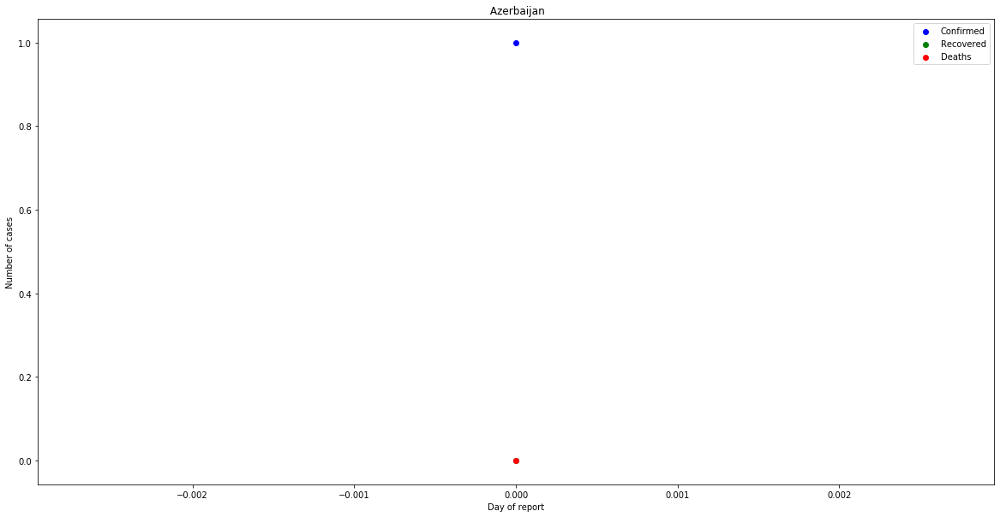

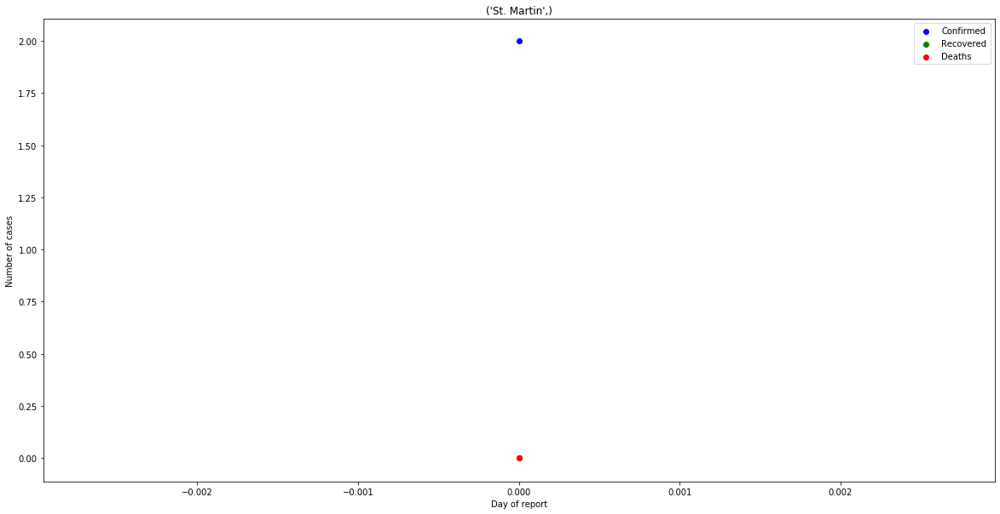

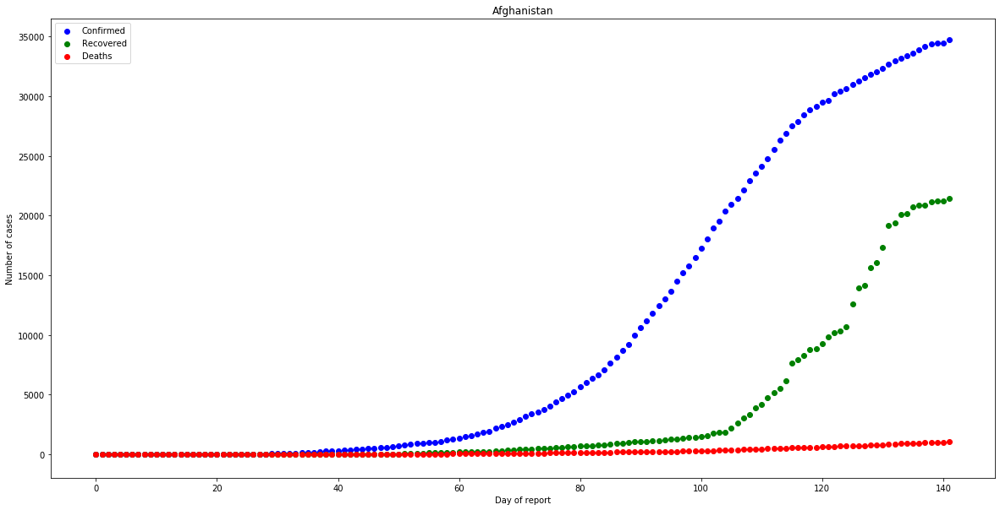

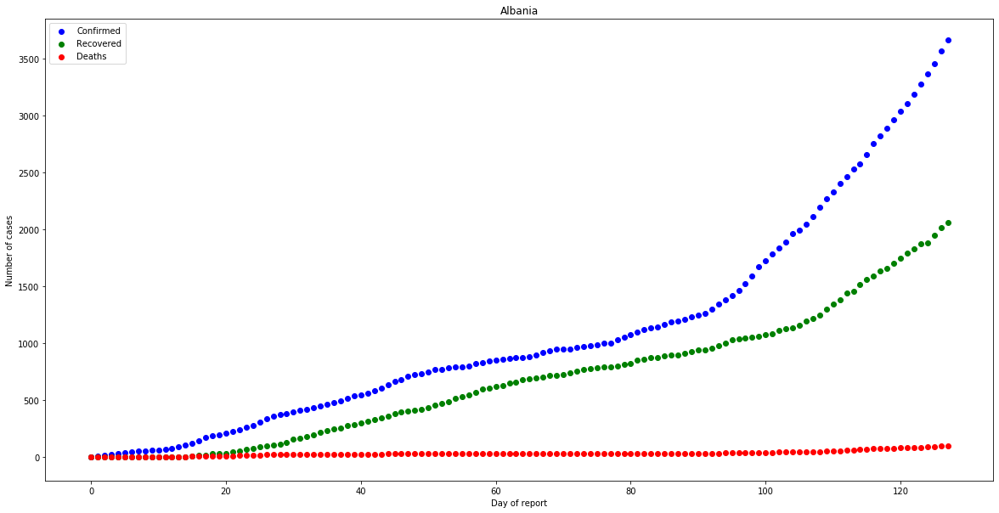

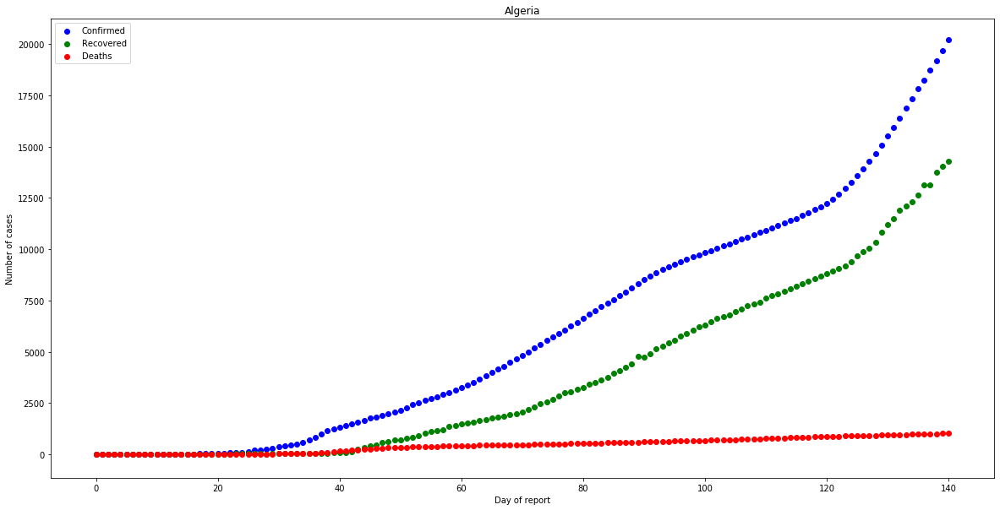

...

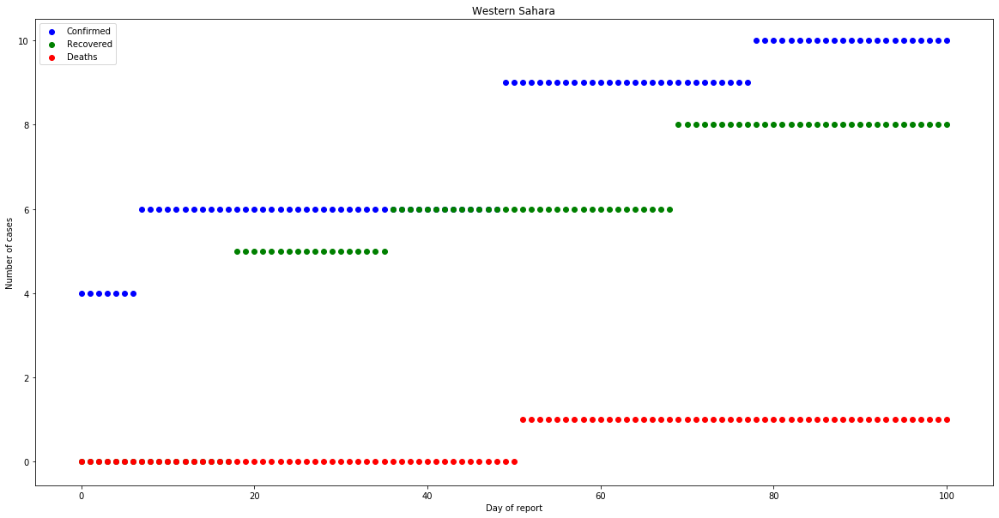

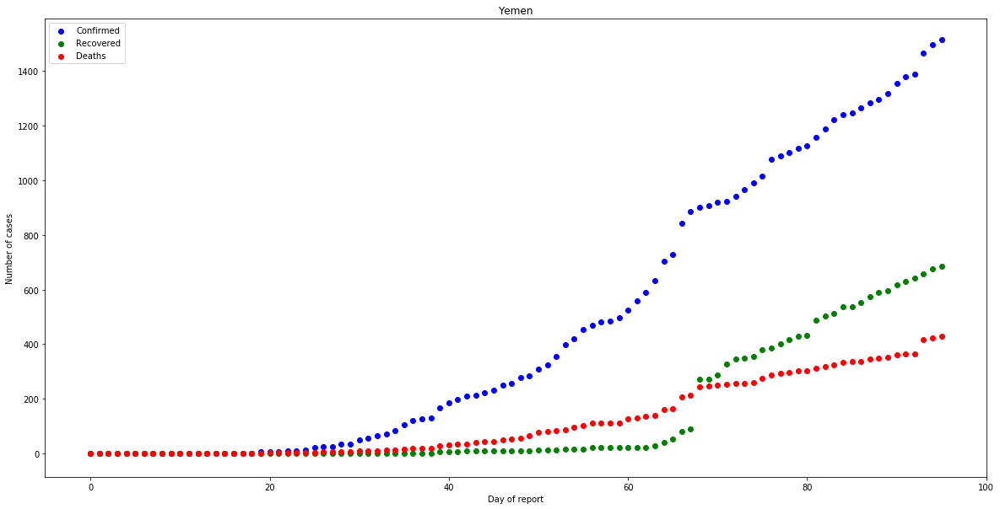

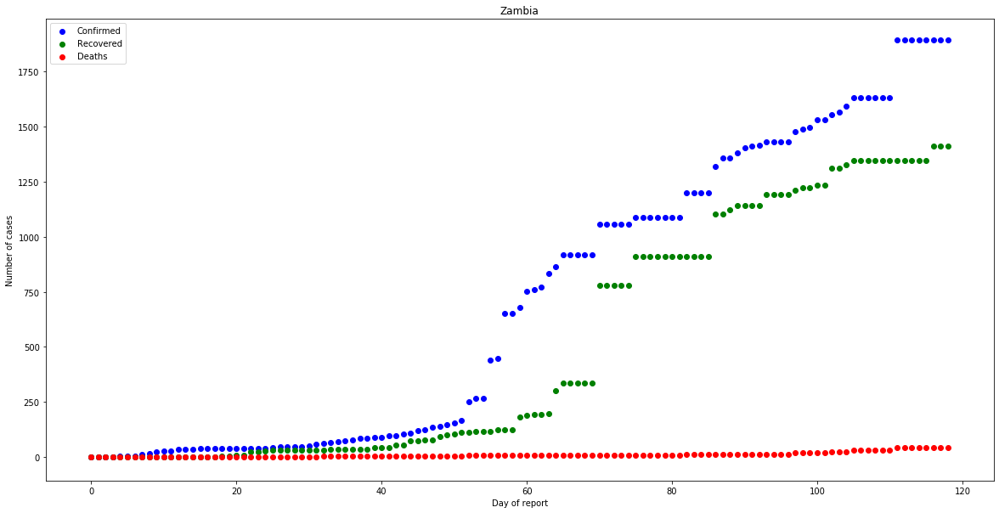

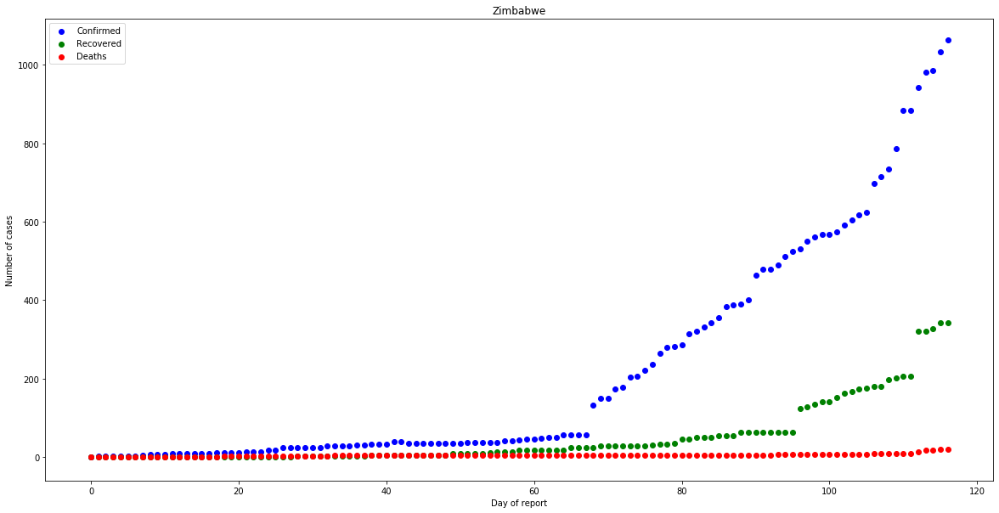

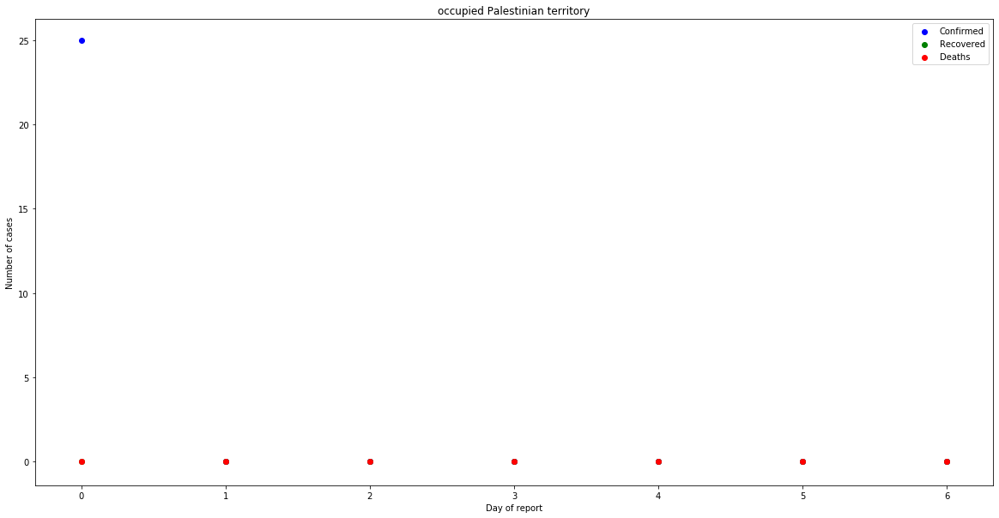

In [236]:
#Create a scatterplot for each country to represent the distribution of specific case overtime.  
for i in range(len(countries)):    
    C = df3[df3['Country']==countries[i]].reset_index()
    plt.figure(figsize=(20, 10))
    plt.scatter(np.arange(len(C)),C['Confirmed'],color='blue',label='Confirmed')
    plt.scatter(np.arange(len(C)),C['Recovered'],color='green',label='Recovered')
    plt.scatter(np.arange(len(C)),C['Deaths'],color='red',label='Deaths')
    plt.legend()
    plt.title(countries[i])
    plt.xlabel('Day of report')
    plt.ylabel('Number of cases')

    plt.show()

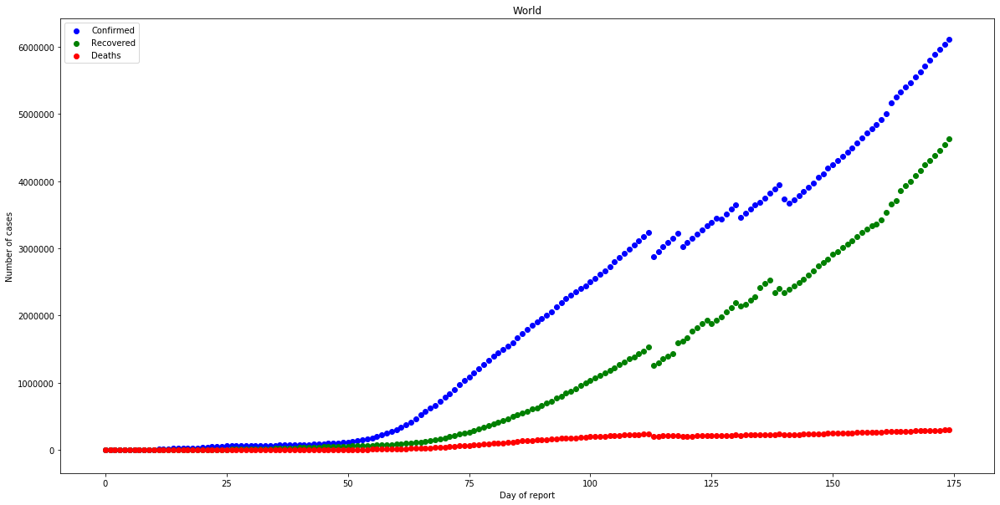

In [250]:
#Create a scatterplot for the whole world to represent the distribution of specific case overtime.  
df4 = df3.groupby(['Date'])[['Confirmed','Deaths','Recovered']].sum().reset_index()
C = df4
plt.figure(figsize=(20, 10))
plt.scatter(np.arange(len(C)),C['Confirmed'],color='blue',label='Confirmed')
plt.scatter(np.arange(len(C)),C['Recovered'],color='green',label='Recovered')
plt.scatter(np.arange(len(C)),C['Deaths'],color='red',label='Deaths')
plt.legend()
plt.title('World')
plt.xlabel('Day of report')
plt.ylabel('Number of cases')
plt.show()